<h1>Basic Demo</h1> 

Basic steps to process video for HRV estimation trough rPPG methods:
<ul>
    <li><a href="#video">Load video and crop faces</a></li>
    <li><a href="#roi">Process ROIs</a></li>
    <li><a href="#method">Apply rPPG methods</a></li>
    <li><a href="#res">Analyze results</a></li>
    <li><a href="#tune">Do fine tuning</a></li>
    <li><a href="#gt">Compare with ground truth (GT)</a></li>
</ul>

In [1]:
# -- Modules and packages to import for demo
from pyVHR.signals.video import Video
from pyVHR.methods.pos import POS
from pyVHR.methods.chrom import CHROM
from pyVHR.analysis.testsuite import TestSuite, TestResult

<a id="video"></a>
<h2>Load video and crop faces</h2> 

Given a video sequence $v(t)$, the process starts by extracting the portion of the image corresponding to the face from each frame.
The face detectors included in the Package pyVHR are: dlib, mtcnn, and Kalman filter for face tracking. Thus,
\begin{equation*}
b(t)=
\begin{cases} 
    \text{dlib}(v(t))  \\ 
    \text{mtcnn}(v(t)) \\ 
    \text{kalman}(v(t)).
\end{cases}
\end{equation*}
The signal $b(t)$ has dimensions $w\times h \times 3 \times W_s$, where $w$ and $h$ are the width and the height of the bounding box containing the face, respectively. Signal $b(t)$ has 3 channels being coded in the RGB-color space, and depth $W_s$ according to the time window considered.

<h3>Download video sample</h3> 
To repeat next experiment:
<ul>
    <li>Download the file <code>ID1.zip</code> (7.57GB) from <a href="https://github.com/partofthestars/LGI-PPGI-DB">github.com/partofthestars/LGI-PPGI-DB</a></li>
    <li>Unpack the file in the pyVHR root directory and rename the folder as <code>sampleDataset</code></li>
    <li>Run the following snippets (cells)</li>
        


   * Video filename: ../video/cv_camera_sensor_stream_handler.avi
         Total frames: 1836
             Duration: 73.44 (sec)
           Frame rate: 25 (fps)
                Codec: rawvideo
           Num frames: 1836
               Height: 480
                Width: 480
             Detector: mtcnn
            Extractor: skvideo

Show video cropped faces, crop size: (212, 158, 3)


interactive(children=(IntSlider(value=1, description='frame', max=1836, min=1), Output()), _dom_classes=('widg…

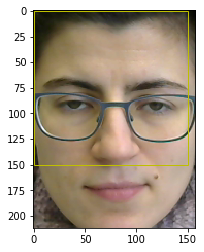

In [2]:
# -- Video object
# videoFilename = "../sampleDataset/alex/alex_resting/cv_camera_sensor_stream_handler.avi"
# videoFilename = "F:/Downloads/SampleDataset/alex/alex_resting/cv_camera_sensor_stream_handler.avi"
videoFilename = "../video/cv_camera_sensor_stream_handler.avi"
video = Video(videoFilename)

# -- extract faces
video.getCroppedFaces(detector='mtcnn', extractor='skvideo')
video.printVideoInfo()

print("\nShow video cropped faces, crop size:", video.cropSize)
video.showVideo()

<a id="roi"></a>
<h2>Process ROIs</h2> 

For each frame $t=1,\dots,T$, given the ROIs, either rectangular patch-based $R(t)$ or skin-based $S(t)$, we average over all the selected pixels to compute the output  $q(t)$ of this step. More formally, if $N$ denotes the number of rectangular patches, $\left|R^{(i)}(t)\right|$ the number of pixels in the $i$-th patch, and  $\left|S(t) \right |$ the number of detected skin pixels within the face, we have
\begin{equation*}
q(t)=\begin{cases} 
    \text{Patch}(R(t)) \\ \text{Skin}(S(t))
    \end{cases}
\end{equation*}
where
\begin{align*}
    \text{Patch}(R(t))&= 
    \frac{1}{N}\sum_{i=1}^N \frac{1}{\left| R^{(i)}(t) \right|} \sum_{(x,y)\in R^{(i)}(t)} R^{(i)}_{x,y}(t)   \\ 
    \text{Skin}(S(t)) &= 
    \frac{1}{\left| S(t) \right |} \sum_{(x,y)\in S(t)}
    S_{x,y}(t)
\end{align*}


      ROI type: rect
   Rect coords: [[15, 20, 140, 50], [10, 120, 100, 30]]


interactive(children=(IntSlider(value=1, description='frame', max=1836, min=1), Output()), _dom_classes=('widg…

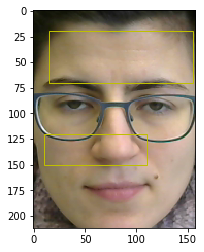

In [4]:
# -- define ROIs: free rectangular regions
video.setMask(typeROI='rect', rectCoords=[[15,20,140,50],[10,120,100,30]])
video.printROIInfo()
video.showVideo()

      ROI type: rect
   Rect coords: [[31, 21, 94, 25], [23, 114, 23, 23], [110, 114, 23, 23], [55, 106, 47, 16]]


interactive(children=(IntSlider(value=1, description='frame', max=1836, min=1), Output()), _dom_classes=('widg…

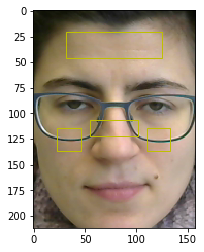

In [5]:
# -- define ROIs: standard regions, i.e. 'forehead', 'lcheek', 'rcheek', 'nose'
video.setMask(typeROI='rect', rectRegions=['forehead', 'lcheek', 'rcheek', 'nose'])
video.printROIInfo()
video.showVideo()

      ROI type: skin_adapt
   Skin thresh: 0.2


interactive(children=(IntSlider(value=1, description='frame', max=1836, min=1), Output()), _dom_classes=('widg…

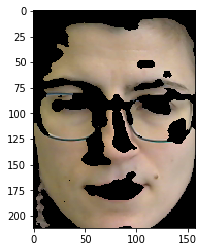

In [6]:
# -- define ROIs: using skin, with threshold param 
video.setMask(typeROI='skin_adapt',skinThresh_adapt=0.2)
video.printROIInfo()
video.showVideo()

      ROI type: skin_fix
   Skin thresh: [20, 50]


interactive(children=(IntSlider(value=1, description='frame', max=1836, min=1), Output()), _dom_classes=('widg…

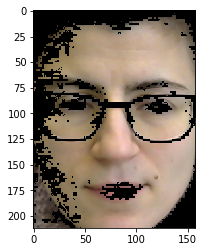

In [7]:
# -- define ROIs: using skin, with threshold param 
video.setMask(typeROI='skin_fix',skinThresh_fix=[20, 50])
video.printROIInfo()
video.showVideo()

<a id="method"></a>
<h2>Apply rPPG methods</h2> 

The temporal RGB trace $x(t) =(x_r(t),x_g(t),x_b(t))^T$ is achieved by preprocessing the raw RGB signal $s(t) =(s_r(t),s_g(t),s_b(t))^T$. The signal $x(t)$ is than split into overlapped subsequences, each  representing samples of a finite-length multivariate measurement with $t= 1,2,...,M$, where $M=W_s\cdot f_{ps}$ is the number of frames selected by the sliding window, being $f_{ps}$ the video frame rate. Thus, a method receives as input a chunk of the sequence $x(t)$ and produces as output a monovariate temporal sequence $y(t)$, i.e. a real BVP estimate coming from the application of the rPPG model.

In [8]:
# -- Define a configuration file. 
#    It contains all the information relative to the dataset (e.g. the path), 
#    and the test procedure (e.g. hyperparamenters)
cfgFilename = '../pyVHR/analysis/sample.cfg'

# -- apply the pipeline until GT comparison
test = TestSuite(configFilename=cfgFilename)

# -- run exp and save results on a pandas file
#    change verb to see more details as follow:
#       0 - not verbose
#       1 - show the main steps
#       2 - display graphic 
#       3 - display spectra  
#       4 - display errors
#       (use also combinations, e.g. verb=21, verb=321)
result = test.start(outFilename='sampleExp.h5', verb=1)

** Run the test with the following config:
      dataset: LGI_PPGI
      methods: ['POS', 'CHROM']

**** Using Method: POS on videoID: 0


mtcnn



Performing face detection...

WARNING! Strange Face Crop... Skipping frame 1...

WARNING! Strange Face Crop... Skipping frame 2...

WARNING! Strange Face Crop... Skipping frame 3...

WARNING! Strange Face Crop... Skipping frame 4...

WARNING! Strange Face Crop... Skipping frame 5...

WARNING! Strange Face Crop... Skipping frame 6...

WARNING! Strange Face Crop... Skipping frame 7...

WARNING! Strange Face Crop... Skipping frame 8...

WARNING! Strange Face Crop... Skipping frame 9...

WARNING! Strange Face Crop... Skipping frame 10...

WARNING! Strange Face Crop... Skipping frame 11...

WARNING! Strange Face Crop... Skipping frame 12...

WARNING! Strange Face Crop... Skipping frame 13...

WARNING! Strange Face Crop... Skipping frame 14...

WARNING! Strange Face Crop... Skipping frame 15...

WARNING! Strange Face Crop... Skipping frame 16...


/usr/local/lib/python3.8/site-packages/pandas/core/generic.py:2490: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed,key->block1_values] [items->Index(['MAE', 'MAX', 'PCC', 'RMSE', 'bpmES', 'bpmGT', 'dataset', 'mask',
       'method', 'sigFilename', 'telapse', 'timeES', 'timeGT',
       'videoFilename'],
      dtype='object')]

  pytables.to_hdf(


<a id="test"></a>
<h2>Test results</h2>

Results from experiments are organized in pandas file and object of type TestResult. 

In [9]:
# -- pandas file for collecting results
result.dataFrame

,EVM,MAE,MAX,PCC,RMSE,bpmES,bpmGT,dataset,mask,method,sigFilename,telapse,timeES,timeGT,videoFilename,videoIdx
0,0.0,[32.92783326740506],[111.474609375],[0.4463493405000159],[42.8973905155509],"[[50.537109375, 46.142578125, 60.791015625, 73...","[103.7109375, 100.1953125, 96.6796875, 93.1640...",LGI_PPGI,,POS,../sampleDataset/alex/alex_gym/cms50_stream_ha...,,"[3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 11.0...","[0.0, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, ...",../sampleDataset/alex/alex_gym/cv_camera_senso...,0.0
1,0.0,[40.45082575158228],[136.083984375],[0.19314810930594184],[50.069347348986135],"[[45.41015625, 45.41015625, 81.298828125, 71.0...","[103.7109375, 100.1953125, 96.6796875, 93.1640...",LGI_PPGI,,CHROM,../sampleDataset/alex/alex_gym/cms50_stream_ha...,,"[3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 11.0...","[0.0, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, ...",../sampleDataset/alex/alex_gym/cv_camera_senso...,0.0


<a id="tune"></a>
<h2>Do fine tuning</h2>

In this section it is shown how to tune parameters, visualize intermediate results, invoke methods on specific dataset 

In [10]:
# -- Detailed pipeline for rafinement steps and tuning  

# -- define some params in the form of dict (those in the cfg file) 
params = {"video": video, "verb":2, "ROImask":"skin_adapt", "skinAdapt":0.2}

# -- invoke the method
m = CHROM(**params)
#m = POS(**params)

# -- invoke the method
bpmES, timesES = m.runOffline(**params)

<a id="gt"></a>
<h2>Compare with ground truth (GT)</h2>

In this section it is shown how to define a new Dataset object of type SAMPLE, to load the BVP ground truth (GT) signal and plot it and to compute the GT BPMs used in comparisons with those estimated by method

In [11]:
from pyVHR.datasets.sample import SAMPLE
from pyVHR.datasets.dataset import Dataset

# -- dataset object
dataset = SAMPLE(videodataDIR='../sampleDataset/', BVPdataDIR='../sampleDataset/alex/alex_resting/')

# -- ground-truth (GT) signal
idx = 0   # index of signal within the list dataset.videoFilenames
fname = dataset.getSigFilename(idx)

# -- load signal and build a BVPsignal or ECGsignal object
sigGT = dataset.readSigfile(fname)
sigGT.plot()

# -- plot signal + peaks
sigGT.findPeaks(distance=20)
sigGT.plotBPMPeaks()

# -- compute BPM GT
winSizeGT = 7
bpmGT, timesGT = sigGT.getBPM(winSizeGT)

Skipping 0.49 seconds...


In [13]:
from pyVHR.utils.errors import getErrors, printErrors, displayErrors

# -- error metrics
RMSE, MAE, MAX, PCC = getErrors(bpmES, bpmGT, timesES, timesGT)
printErrors(RMSE, MAE, MAX, PCC)
displayErrors(bpmES, bpmGT, timesES, timesGT)


    * Errors: RMSE = 37.23, MAE = 36.83, MAX = 44.24, PCC = 0.24


In [12]:
# -- print BPM
print("BPMs of the GT signal averaged on winSizeGT = %d sec:" %winSizeGT)
print(bpmGT)

# -- plot spectrogram
sigGT.displaySpectrum()

BPMs of the GT signal averaged on winSizeGT = 7 sec:
[101.953125  100.1953125  96.6796875  93.1640625  93.1640625  93.1640625
  93.1640625  93.1640625  94.921875   96.6796875  96.6796875  98.4375
  98.4375     98.4375    100.1953125 100.1953125 100.1953125 101.953125
 103.7109375 103.7109375 103.7109375 103.7109375 103.7109375 103.7109375
 105.46875   107.2265625 107.2265625 108.984375  107.2265625 107.2265625
 107.2265625 107.2265625 107.2265625 107.2265625 107.2265625 107.2265625
 107.2265625 107.2265625 107.2265625 107.2265625 105.46875   105.46875
 105.46875   105.46875   103.7109375 103.7109375 103.7109375 105.46875
 105.46875   107.2265625 108.984375  108.984375  108.984375  108.984375
 105.46875   103.7109375 101.953125  100.1953125 100.1953125 100.1953125
 101.953125  101.953125  105.46875   107.2265625 107.2265625 105.46875
 101.953125  100.1953125 100.1953125 100.1953125 100.1953125 101.953125
 103.7109375 105.46875   105.46875   107.2265625 108.984375  110.7421875
 108.98437